In [44]:

import os
import sys
import time
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
from collections import defaultdict 



In [45]:
def remove_missing_data(df):
        for col in df.columns:
            try:
                df[col].replace({".": np.nan}, inplace=True)
            except Exception as e:
                print(e, "\n No missing values in", col)

        return df.dropna()


In [46]:

sys.path.append("../codes")

import utilities as util



# Load data

In [47]:

data_sets_xls = pd.ExcelFile("../data/IA_report.xlsx")

print(data_sets_xls.sheet_names)




['dyslexia', 'risk', 'norm']


In [48]:

    
data_sets = defaultdict(list)


for sheet in data_sets_xls.sheet_names:
    tmp =  pd.read_excel(data_sets_xls, sheet)
    tmp = remove_missing_data(df=tmp)
    tmp.replace({"norm": 1, "risk": 2, "dyslexia":3, }, inplace=True)
    tmp = tmp.astype({
        "Group": int,
        "SubjectID": str,
        "Sentence_ID":int, 
        "Word_Number": int, 
        "QUESTION_ACCURACY": int, 
        "FIXATION_COUNT": int, 
        "SKIP": int, 
        "TOTAL_READING_TIME": float, 
        "FIRST_FIXATION_DURATION": float,
        "FIRST_FIXATION_X": float, 
        "FIRST_FIXATION_Y": float, 
        "FIRST_RUN_TOTAL_READING_TIME": float, 
        "FIRST_SACCADE_AMPLITUDE": float, 
        "REGRESSION_IN": int, 
        "REGRESSION_OUT": int, 
        "REGRESSION_OUT_FULL": int, 
        "REGRESSION_PATH_DURATION": float,         
        })  

    data_sets[sheet] = tmp.sort_values(by=["SubjectID"]).dropna()

    print(sheet, tmp.shape)

    

dyslexia (12641, 17)
risk (4148, 17)
norm (39622, 17)


In [49]:

data_sets["norm"].head()



,Group,SubjectID,Sentence_ID,Word_Number,QUESTION_ACCURACY,FIXATION_COUNT,SKIP,TOTAL_READING_TIME,FIRST_FIXATION_DURATION,FIRST_FIXATION_X,FIRST_FIXATION_Y,FIRST_RUN_TOTAL_READING_TIME,FIRST_SACCADE_AMPLITUDE,REGRESSION_IN,REGRESSION_OUT,REGRESSION_OUT_FULL,REGRESSION_PATH_DURATION
40476,1,10,17,2,1,1,0,317.0,317.0,224.9,535.6,317.0,1.60,0,0,0,317.0
40379,1,10,21,4,-1,3,0,621.0,224.0,554.2,533.0,621.0,5.74,0,0,0,621.0
40380,1,10,21,5,-1,2,0,380.0,241.0,685.6,536.8,380.0,3.56,0,0,0,380.0
40381,1,10,21,6,-1,3,0,381.0,181.0,855.8,553.1,381.0,1.39,0,0,0,381.0
40382,1,10,21,7,-1,4,0,694.0,130.0,1049.7,542.9,694.0,4.89,0,0,0,694.0


In [50]:

data_sets["dyslexia"].head()



,Group,SubjectID,Sentence_ID,Word_Number,QUESTION_ACCURACY,FIXATION_COUNT,SKIP,TOTAL_READING_TIME,FIRST_FIXATION_DURATION,FIRST_FIXATION_X,FIRST_FIXATION_Y,FIRST_RUN_TOTAL_READING_TIME,FIRST_SACCADE_AMPLITUDE,REGRESSION_IN,REGRESSION_OUT,REGRESSION_OUT_FULL,REGRESSION_PATH_DURATION
2079,3,ake05,25,3,-1,6,0,2588.0,330.0,472.1,564.1,330.0,1.52,0,1,1,5213.0
2007,3,ake05,24,7,-1,13,0,4073.0,387.0,931.8,507.8,3005.0,2.06,1,0,0,3005.0
2006,3,ake05,24,6,-1,5,0,1093.0,127.0,775.9,540.9,1093.0,1.17,0,0,0,1093.0
2005,3,ake05,24,5,-1,6,0,1436.0,317.0,653.3,518.8,509.0,1.33,0,1,1,2235.0
2004,3,ake05,24,4,-1,9,0,3522.0,501.0,477.7,528.6,501.0,1.45,1,1,1,3183.0


In [51]:

data_sets["risk"].head()



,Group,SubjectID,Sentence_ID,Word_Number,QUESTION_ACCURACY,FIXATION_COUNT,SKIP,TOTAL_READING_TIME,FIRST_FIXATION_DURATION,FIRST_FIXATION_X,FIRST_FIXATION_Y,FIRST_RUN_TOTAL_READING_TIME,FIRST_SACCADE_AMPLITUDE,REGRESSION_IN,REGRESSION_OUT,REGRESSION_OUT_FULL,REGRESSION_PATH_DURATION
1339,2,m107,21,3,-1,7,1,2341.0,111.0,515.7,594.1,111.0,11.05,1,0,1,3121.0
1269,2,m107,13,2,0,4,0,909.0,206.0,236.5,540.1,909.0,1.39,0,0,0,909.0
1270,2,m107,13,3,0,2,0,564.0,239.0,450.7,520.1,239.0,2.00,1,0,0,239.0
1271,2,m107,13,4,0,3,0,660.0,314.0,543.5,536.9,314.0,1.67,0,1,1,985.0
1272,2,m107,13,5,0,1,0,222.0,222.0,729.1,529.2,222.0,1.61,0,0,0,222.0


In [52]:


data_dyslexia_cols = data_sets["dyslexia"].columns
data_norm_cols = data_sets["norm"].columns
data_risk_cols = data_sets["risk"].columns




In [53]:

set(data_dyslexia_cols == data_norm_cols)



{True}

In [54]:

set(data_norm_cols == data_risk_cols)



{True}

In [55]:

data = pd.concat([v for k, v in data_sets.items()], axis=0)
data.shape



(56411, 17)

In [56]:

data.head()



,Group,SubjectID,Sentence_ID,Word_Number,QUESTION_ACCURACY,FIXATION_COUNT,SKIP,TOTAL_READING_TIME,FIRST_FIXATION_DURATION,FIRST_FIXATION_X,FIRST_FIXATION_Y,FIRST_RUN_TOTAL_READING_TIME,FIRST_SACCADE_AMPLITUDE,REGRESSION_IN,REGRESSION_OUT,REGRESSION_OUT_FULL,REGRESSION_PATH_DURATION
2079,3,ake05,25,3,-1,6,0,2588.0,330.0,472.1,564.1,330.0,1.52,0,1,1,5213.0
2007,3,ake05,24,7,-1,13,0,4073.0,387.0,931.8,507.8,3005.0,2.06,1,0,0,3005.0
2006,3,ake05,24,6,-1,5,0,1093.0,127.0,775.9,540.9,1093.0,1.17,0,0,0,1093.0
2005,3,ake05,24,5,-1,6,0,1436.0,317.0,653.3,518.8,509.0,1.33,0,1,1,2235.0
2004,3,ake05,24,4,-1,9,0,3522.0,501.0,477.7,528.6,501.0,1.45,1,1,1,3183.0


In [57]:


set(data.columns == data_dyslexia_cols)



{True}

In [58]:

# pd.get_dummies(data, columns=["Sex"])



In [59]:

# dyslexia = data.loc[data["Group"]=="dyslexia"]

# dyslexia = data_sets["dyslexia"]



In [60]:
def plot_pies(data, col, labels):
    
    fig = plt.figure(figsize=(20, 10))
    ctr = 1
    for k, v in data.items():
        ax = fig.add_subplot(1, 3, ctr)  # three datasets
        x = [len(v[col].loc[v[col]==f]) for f in set(v[col])]
        if not labels:
            labels = set(v[col])
            patches, texts, autotexts = ax.pie(x=x, 
                                               labels=labels,
                                               autopct='%.2f', 
                                               textprops={'fontsize': 8},
                                              )
            labels = None
        else:   
            patches, texts, autotexts = ax.pie(x=x, 
                                               labels=labels, 
                                               autopct='%.2f', 
                                               textprops={'fontsize': 8}
                                              )
            
        plt.title(k, fontsize=20)
        ctr += 1
    plt.show()


    return None
    

In [61]:

# # Gender percentage: 
# plot_pies(data=data_sets, col="Sentence_ID", labels=None)




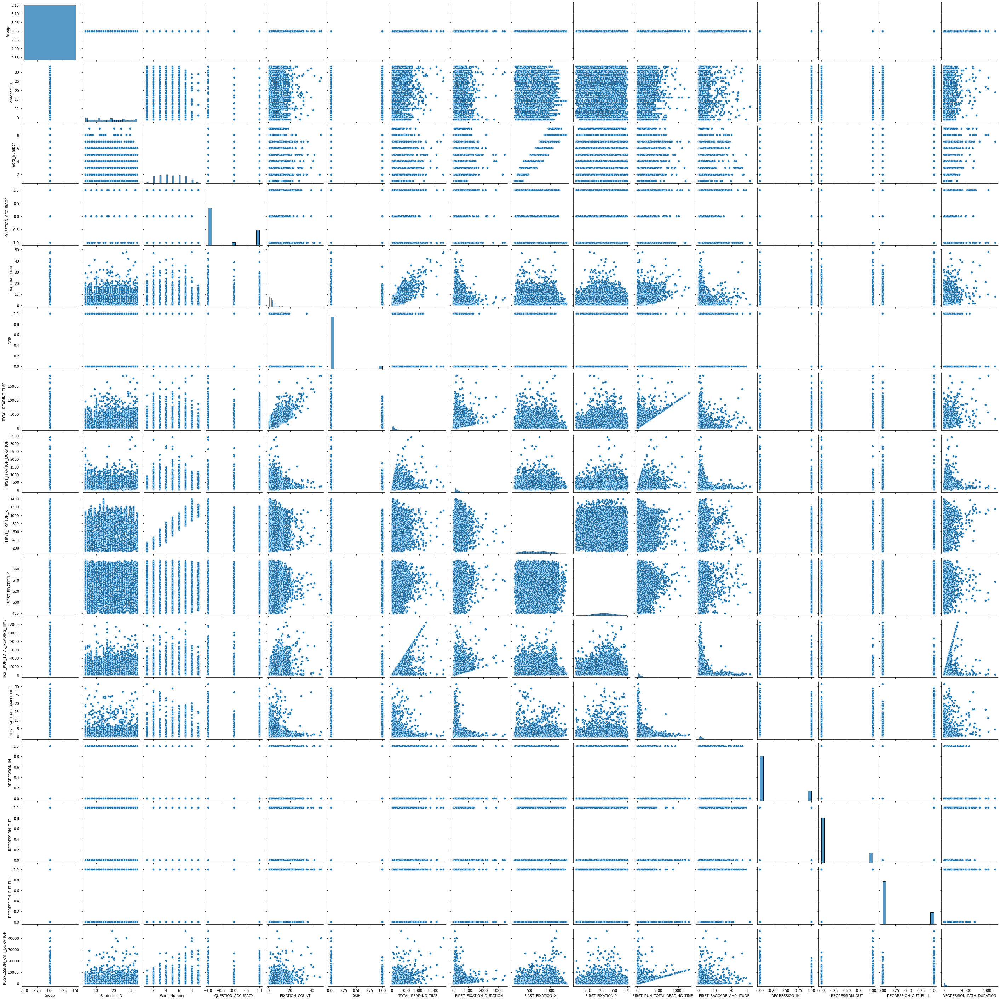

In [62]:

# Dyslexia pairplots:
sns.pairplot(data=data_sets["dyslexia"], )
plt.show()
    
    




- No linear correlation between any two pairs of the features


- Features distribution could be important 


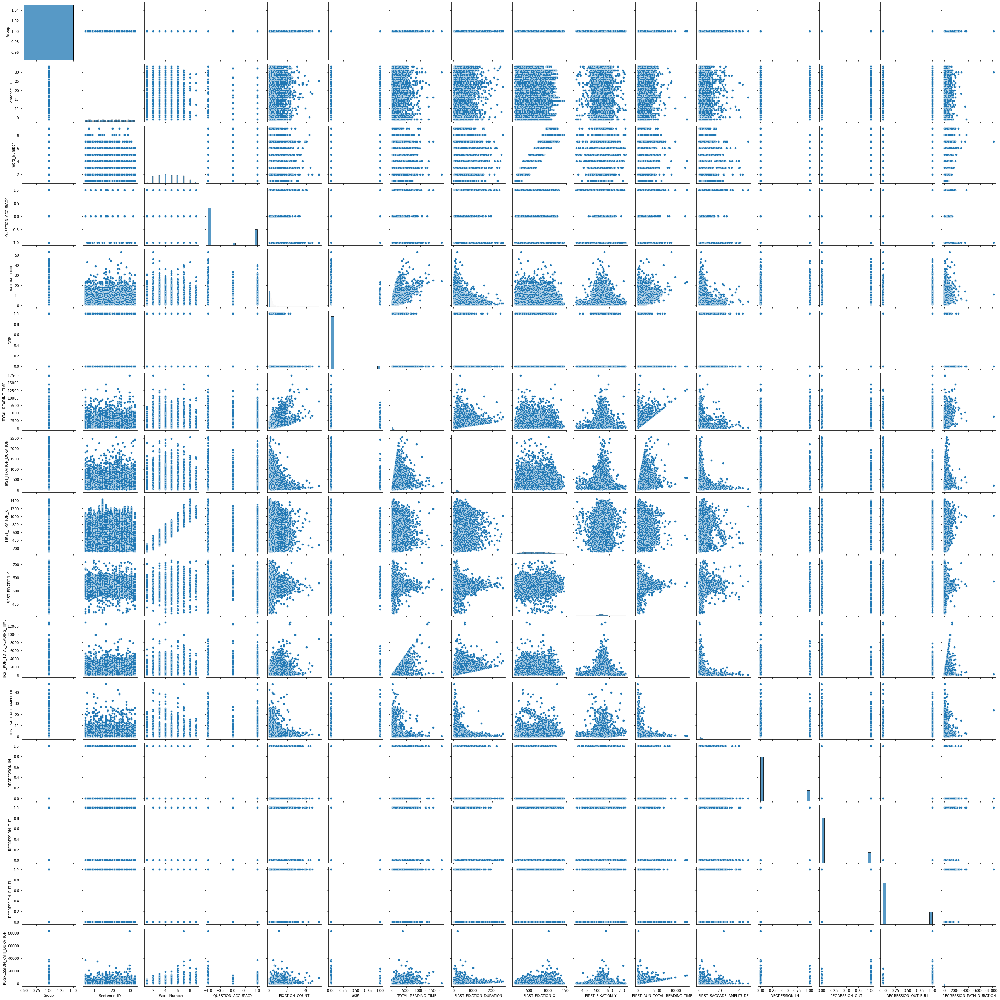

In [63]:

# Normal data pair-plots
sns.pairplot(data=data_sets["norm"], )
plt.show()





- No linear correlation between any two pairs of the features


- Features distribution could be important 



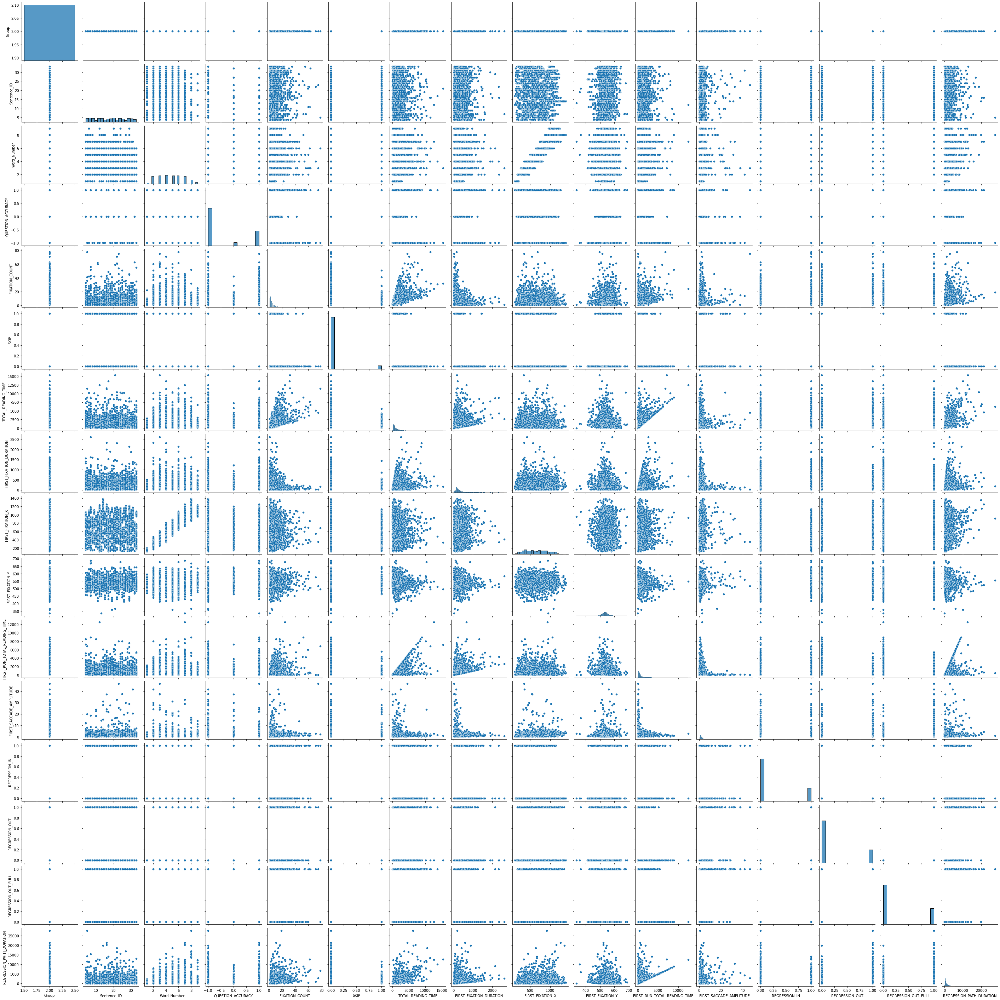

In [64]:


sns.pairplot(data=data_sets["risk"], )
plt.show()





- No linear correlation between any two pairs of the features

- features distribution could be important 




# Per Features plots

In [65]:
def plot_bars(data, col, x_label, y_label):
    
    fig = plt.figure(figsize=(17, 7))
    ax = fig.add_subplot(1, 1, 1)  # three datasets


    xs, heights, titles = [], [], []

    for k, v in data.items():
        titles.append(k)
        x = np.asarray([len(v[col].loc[v[col]==f]) for f in set(v[col])])
        x = np.divide(x, x.sum())
        heights.append(x)
        labels = set(v[col])

        xs.append(np.arange(4, len(labels)+4))


    ax.bar(x=xs[0],
           height=heights[0],
           color="r",
           alpha=0.9
          )


    ax.bar(x=xs[1],  
           height=heights[1],
           color="y",
           alpha=0.6,
          )

    ax.bar(x=xs[2],  
           height=heights[2],
           color="g",
           alpha=0.3
          )



    plt.xlabel(x_label, fontsize=10)
    plt.ylabel(y_label, fontsize=12)

    plt.legend(titles)

    plt.show()
    
    
    return None



    
    

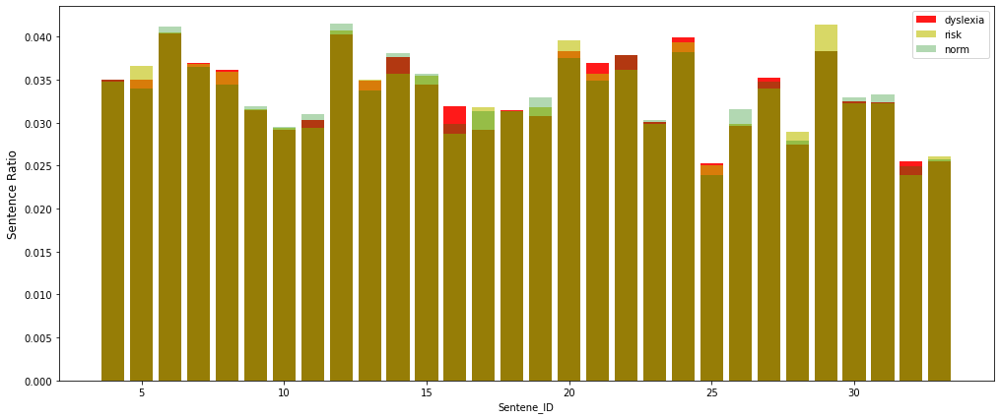

In [66]:


plot_bars(data=data_sets, col="Sentence_ID",
          x_label="Sentene_ID", 
          y_label="Sentence Ratio")




- Despite having fewer dyslexic/ at-risk participants, most of the sentences' ratio is higher than the normal group, which shows that these two groups repeated reading more sentences.
    
    - However, for sentences 5 and 29, normal participants repeated these two sentences more.



In [67]:
def plot_hists(data, col):
    
    colors = ["r", "y", "g"]
    fig = plt.figure(figsize=(20, 9))
    ctr = 1 
    for k, v in data.items():
        ax = fig.add_subplot(1, 3, ctr)  # three datasets
        x = v[col].values
        bins = np.linspace(x.min(), x.max(), 40)
        ax.hist(x=x, bins=bins, color=colors[ctr-1])
        ax.set_title(k, fontsize=16)
        ctr += 1

    fig.suptitle(col + " Distributions", fontsize=19)
    plt.show()
    
    return None

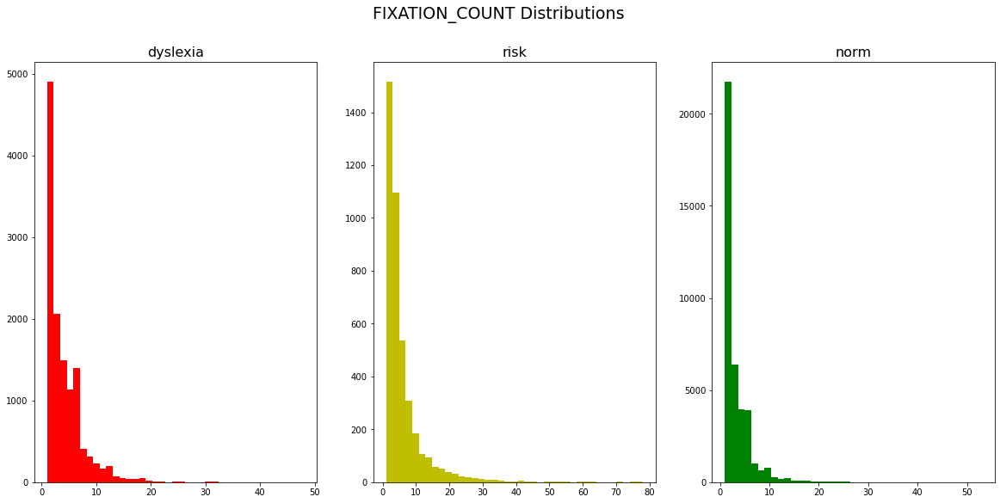

In [68]:


plot_hists(data=data_sets, col="FIXATION_COUNT")



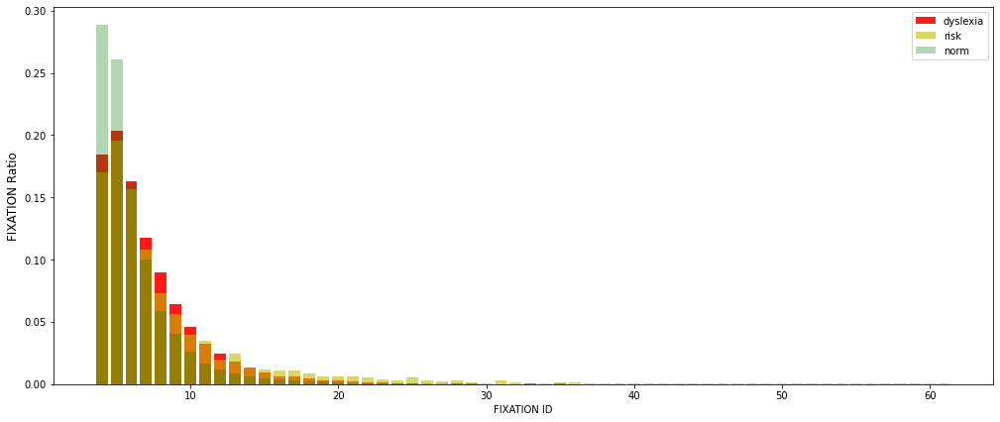

In [69]:

plot_bars(data=data_sets, 
          col="FIXATION_COUNT",
          x_label="FIXATION ID", 
          y_label="FIXATION Ratio")



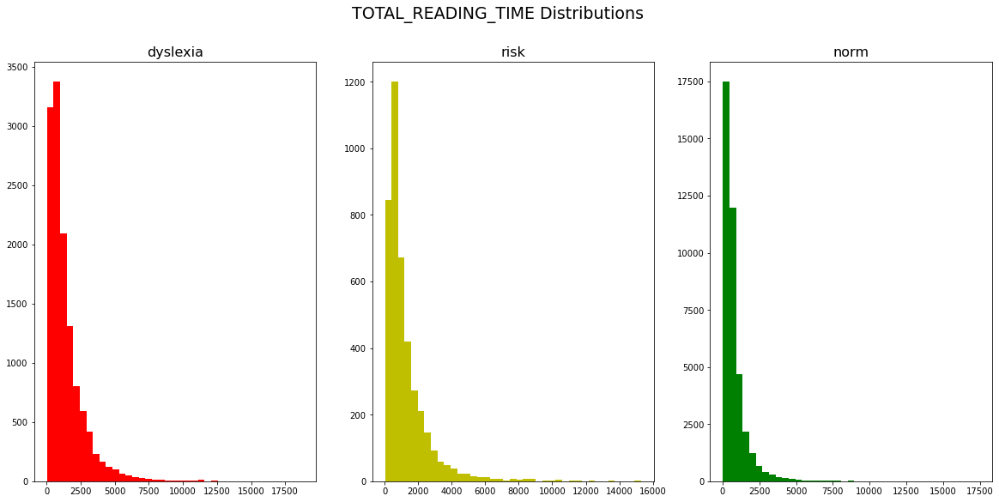

In [70]:


plot_hists(data=data_sets, col="TOTAL_READING_TIME")



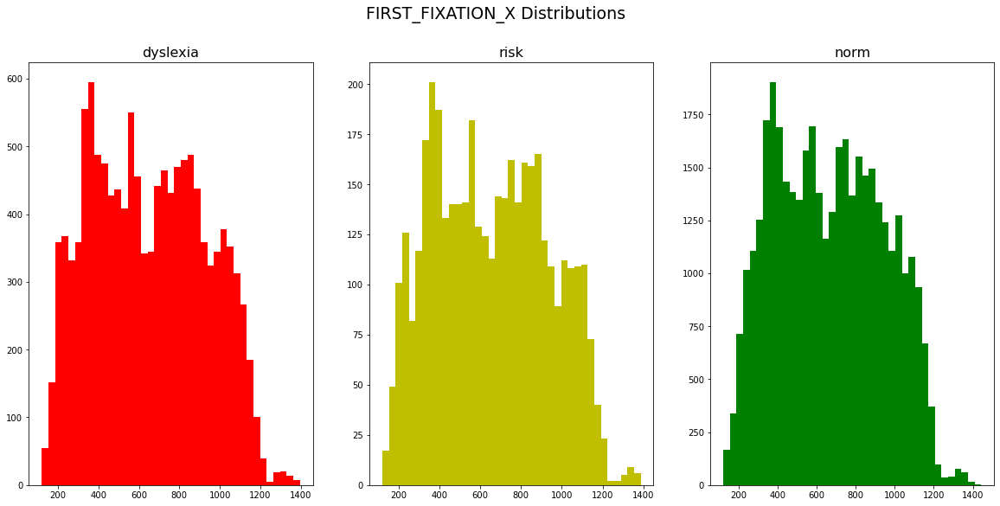

In [71]:


plot_hists(data=data_sets, col="FIRST_FIXATION_X")

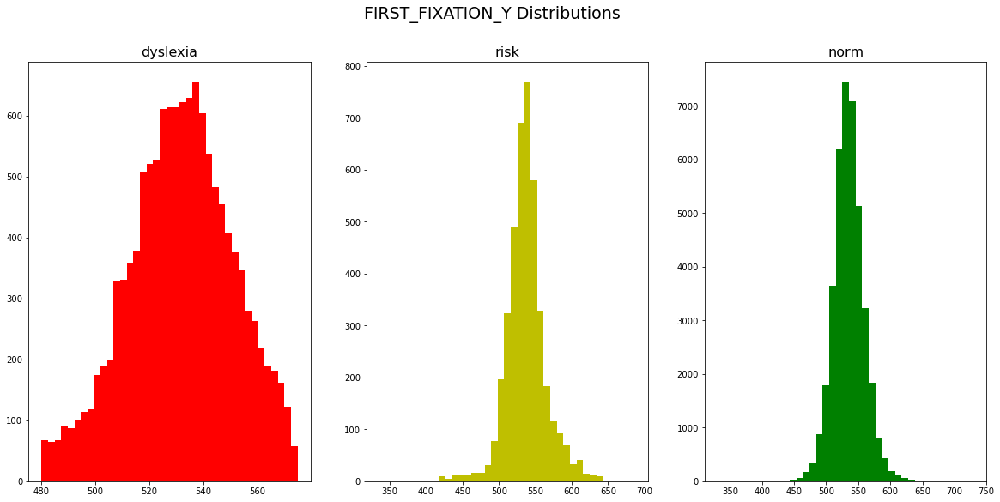

In [72]:


plot_hists(data=data_sets, col="FIRST_FIXATION_Y")






- It seems the major difference between dyslexic and other classes is in the fixation along Y coordinates.



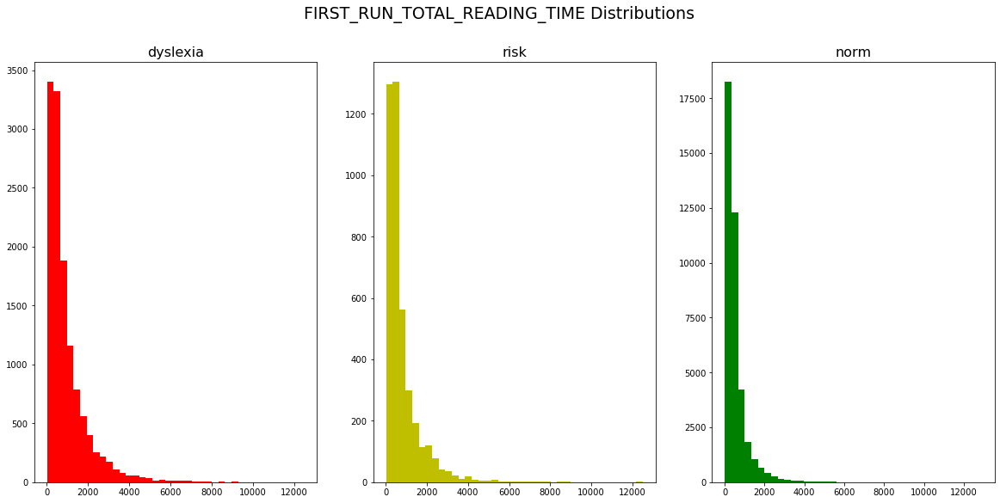

In [73]:


plot_hists(data=data_sets, col="FIRST_RUN_TOTAL_READING_TIME")



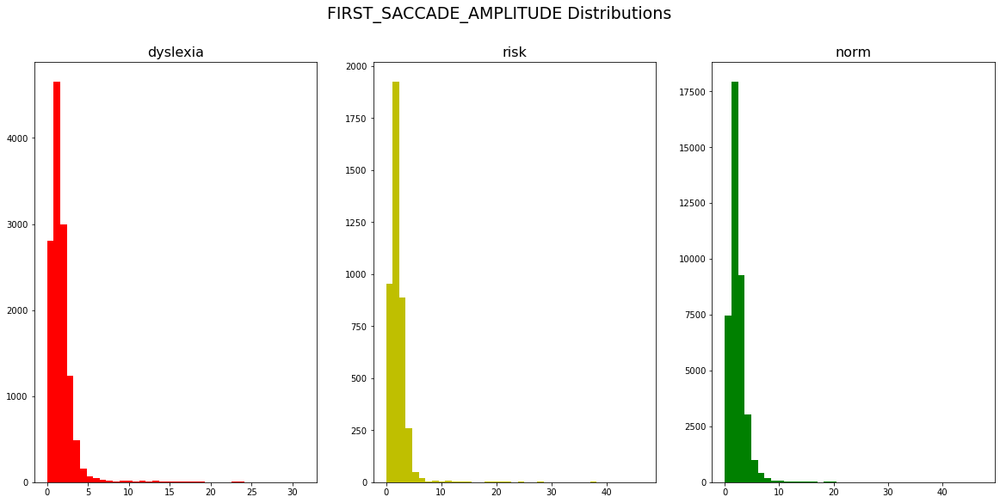

In [74]:


plot_hists(data=data_sets, col="FIRST_SACCADE_AMPLITUDE")





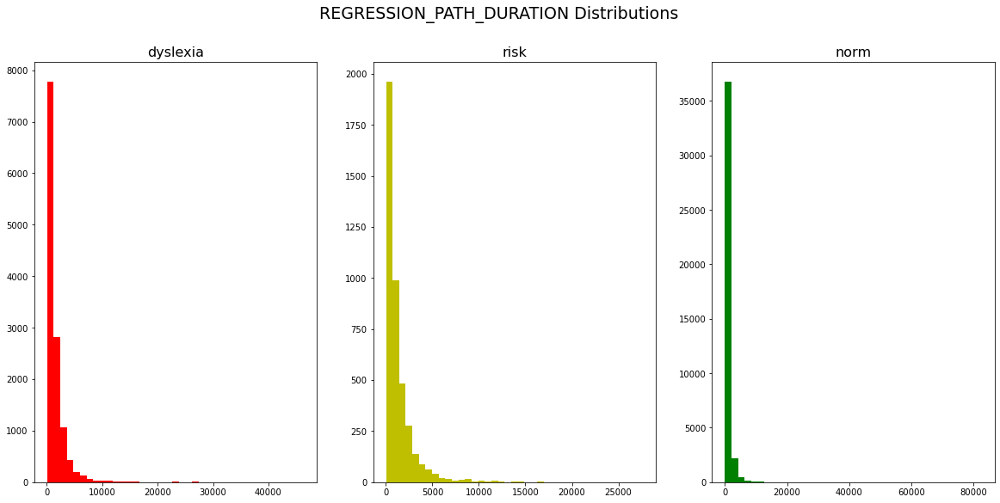

In [75]:

plot_hists(data=data_sets, col="REGRESSION_PATH_DURATION")


# Plotting per word number 

In [76]:

def plot_per_sentence_per_user(data, sentence, norm_users, risk_users, dyslexic_users, index):
    
    N = min(len(norm_users), len(risk_users), len(dyslexic_users))
        
    if index > N:
        print("index is larger that number of at risk or dyslexic users")        
    assert not index > N
    

    features = list(data.columns)[4:]

    yn = data.loc[(data["Sentence_ID"] == sentence) &
                  (data["SubjectID"] == norm_users[index])
                 ]
    xn = yn["Word_Number"]

    yr = data.loc[(data["Sentence_ID"] == sentence) & 
                  (data["SubjectID"] == risk_users[index])
                 ]
    xr = yr["Word_Number"]

    yd = data.loc[(data["Sentence_ID"] == sentence) & 
                  (data["SubjectID"] == dyslexic_users[index])
                 ]
    xd = yd["Word_Number"]



    for f in features:

        fig = plt.figure(figsize=(13, 3))
        ax = fig.add_subplot(1, 1, 1)  # three datasets
        plt.plot(xn, yn[f], "g-.", linewidth=4, )
        plt.plot(xr, yr[f], "y-+", linewidth=2, )
        plt.plot(xd, yd[f], "r-o", linewidth=1, )
        plt.xlabel("Word Number", fontsize=10)
        plt.ylabel(f, fontsize=9)

        plt.legend(["Norm", "Risk", "Dyslexia"])

    plt.show()
    
    return yn, yr, yd





In [77]:


sentences = np.unique(data.Sentence_ID)
norm_users = np.unique(data.loc[data["Group"]==1].loc[:, "SubjectID"])
risk_users = np.unique(data.loc[data["Group"]==2].loc[:, "SubjectID"])
dyslexic_users = np.unique(data.loc[data["Group"]==3].loc[:, "SubjectID"])



In [78]:

features = ["FIXATION_COUNT", 
            "TOTAL_READING_TIME", 
            "FIRST_FIXATION_DURATION",
            "FIRST_FIXATION_X", 
            "FIRST_FIXATION_Y",
            "FIRST_RUN_TOTAL_READING_TIME", 
            "FIRST_SACCADE_AMPLITUDE", 
            "REGRESSION_PATH_DURATION", 
           ]

features



['FIXATION_COUNT',
 'TOTAL_READING_TIME',
 'FIRST_FIXATION_DURATION',
 'FIRST_FIXATION_X',
 'FIRST_FIXATION_Y',
 'FIRST_RUN_TOTAL_READING_TIME',
 'FIRST_SACCADE_AMPLITUDE',
 'REGRESSION_PATH_DURATION']

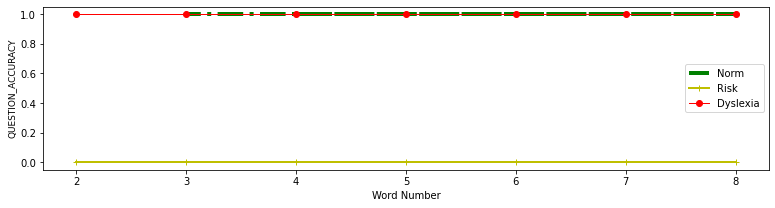

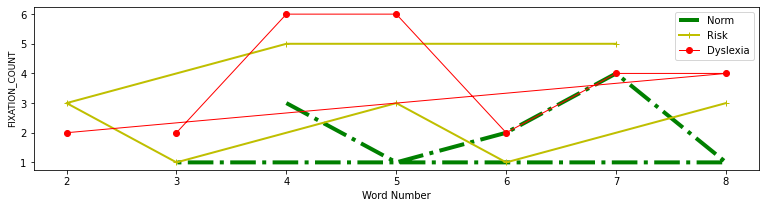

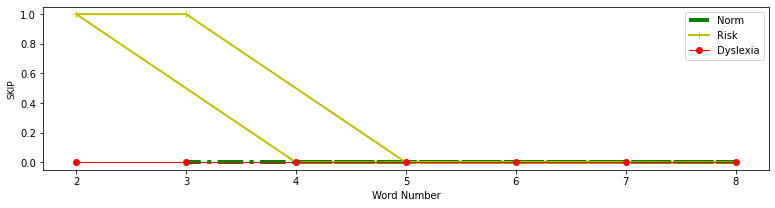

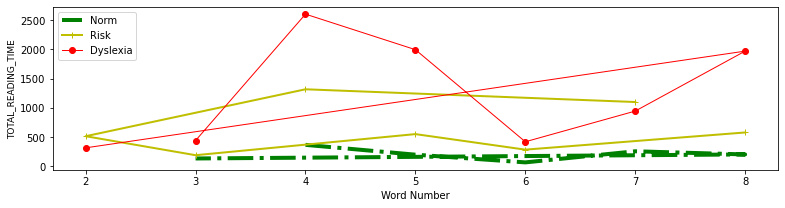

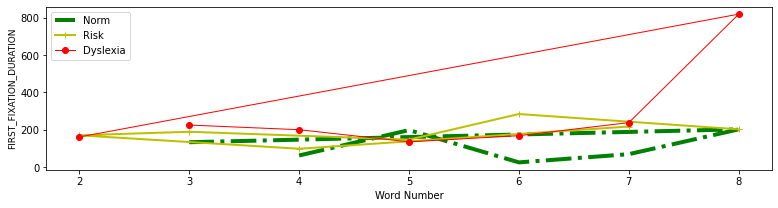

...

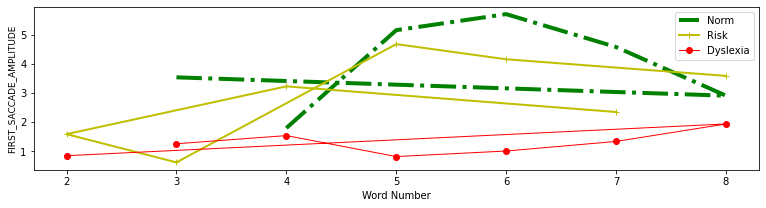

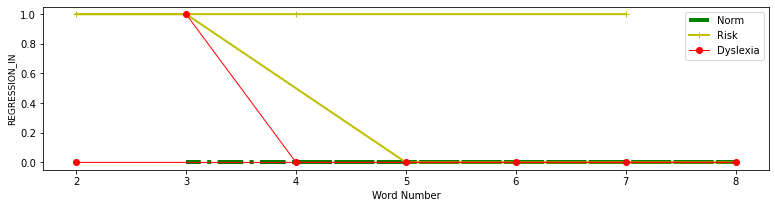

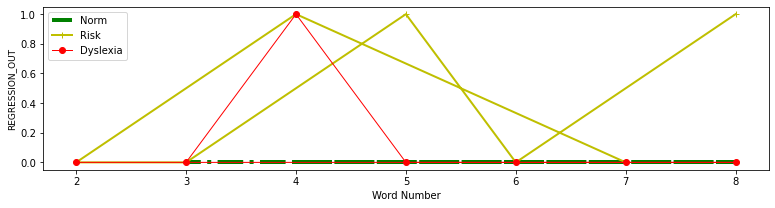

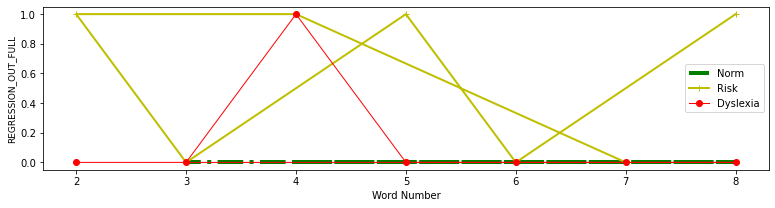

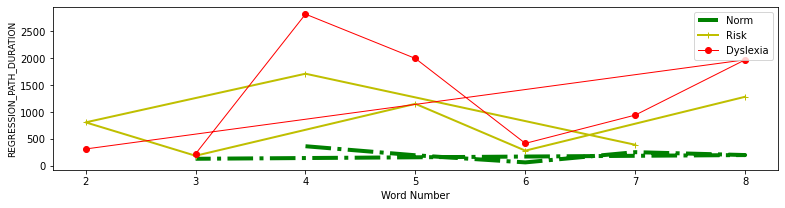

In [79]:


_ = plot_per_sentence_per_user(data, sentences[0], norm_users, risk_users, dyslexic_users, 1)



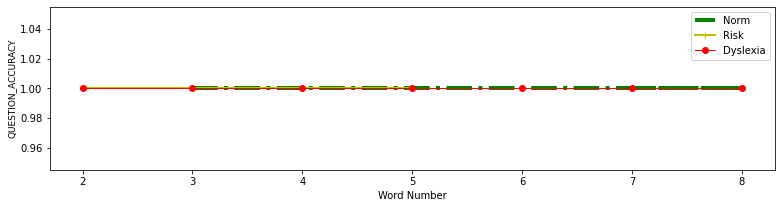

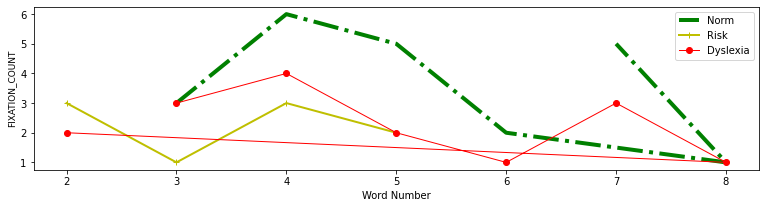

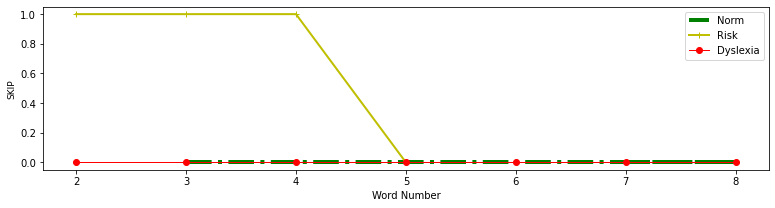

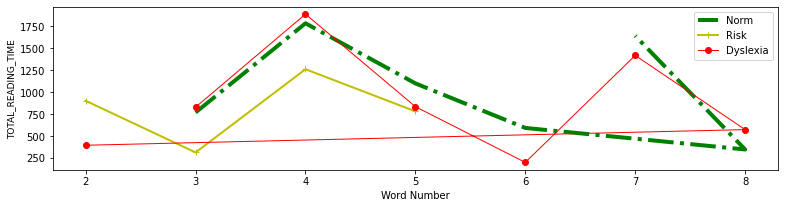

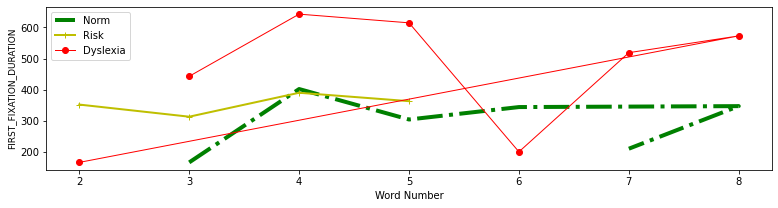

...

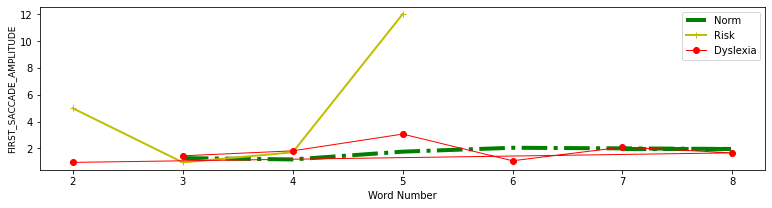

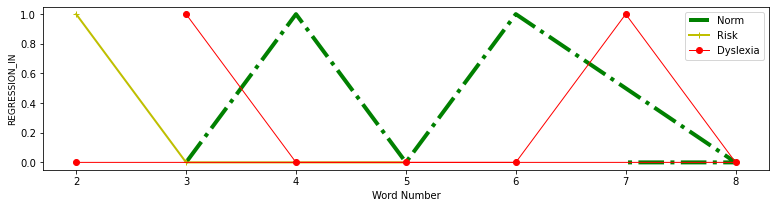

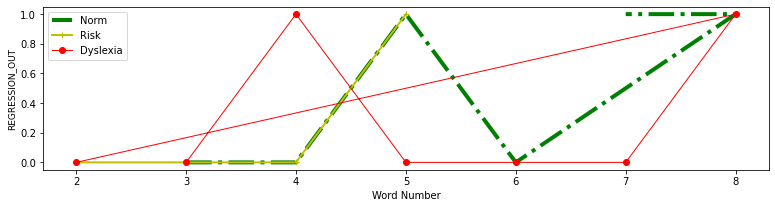

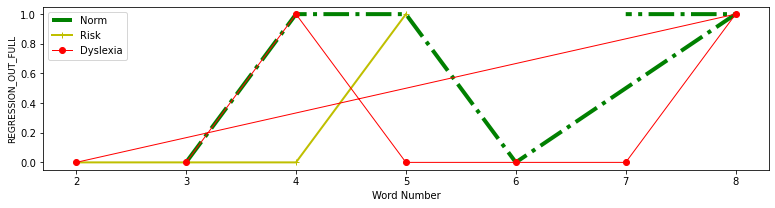

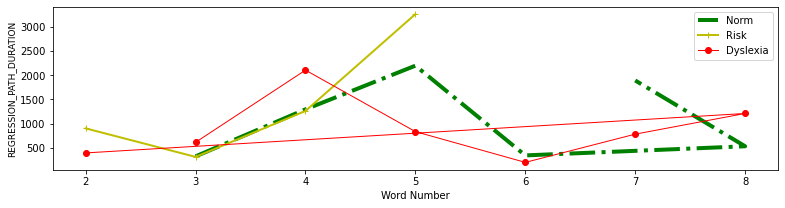

In [80]:


yn, yr, yd = plot_per_sentence_per_user(data, sentences[0], norm_users, risk_users, dyslexic_users, 10)



In [81]:


def plot_sevaral_sentences_per_user(data, sentences, norm_users, risk_users, dyslexic_users, index):
    
    N = min(len(norm_users), len(risk_users), len(dyslexic_users))
    markers = ["o", "s", "x", "+", "p", "*", "D", "v", "<", ",", ":"]
        
    if index > N:
        print("index is larger that number of at risk or dyslexic users")        
    assert not index > N
    

    features = list(data.columns)[4:]
        
    yn, yr, yd = [], [], []
    xn, xr, xd = [], [], []
    
    for sentence in sentences:
        
        _yn  = data.loc[(data["Sentence_ID"] == sentence) &
                      (data["SubjectID"] == norm_users[index])
                     ]
        yn.append(_yn)
        xn.append(_yn["Word_Number"])
        
        _yr = data.loc[(data["Sentence_ID"] == sentence) & 
                      (data["SubjectID"] == risk_users[index])
                     ]
        
        yr.append(_yr)
        xr.append(_yr["Word_Number"])
        
        _yd = data.loc[(data["Sentence_ID"] == sentence) & 
                      (data["SubjectID"] == dyslexic_users[index])
                     ]
        yd.append(_yd)
        
        xd.append(_yd["Word_Number"])
    
    for f in features:
        fig = plt.figure(figsize=(15, 4))
        ax = fig.add_subplot(1, 1, 1)  # three datasets
        for i in range(len(xn)): 
            
            plt.plot(xn[i], yn[i][f],
                     color='g', 
                     linestyle=':',
                     marker=markers[i],
                     markerfacecolor='green',
                     markersize=5,
                     linewidth=3, 
                     # alpha=1.0,
                     label="Norm-"+str(i+1),
                    )
            
            plt.plot(xr[i], yr[i][f],
                     color="y",
                     linestyle='-.',
                     marker=markers[i],
                     markerfacecolor='yellow',
                     markersize=4,
                     linewidth=2, 
                     label="Risk-"+str(i+1),
                     # alpha=0.5,
                    )
            
            plt.plot(xd[i], yd[i][f],
                     color="r",
                     linestyle='-',
                     marker=markers[i],
                     markerfacecolor='red',
                     markersize=5,
                     label="Dyslexia-"+str(i+1),
                     linewidth=1,
                    )
            
            plt.xlabel("Word Number", fontsize=10)
            plt.ylabel(f, fontsize=9)

        plt.legend()

    plt.show()
    
    return yn, yr, yd






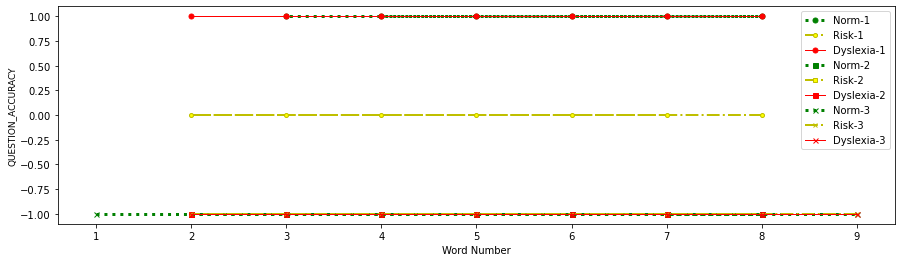

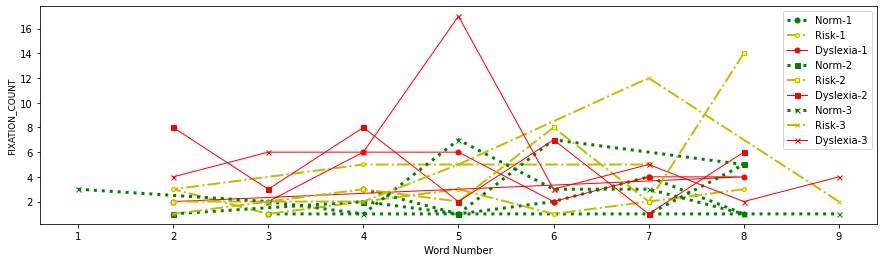

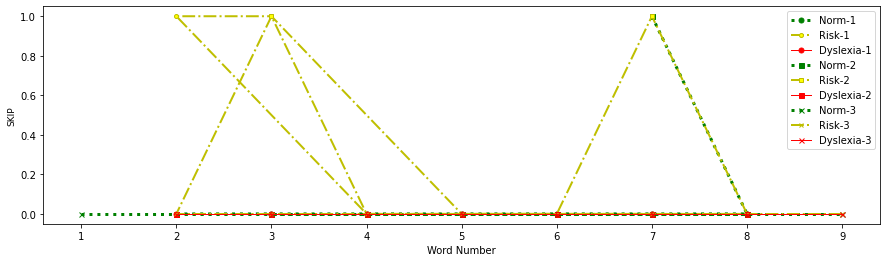

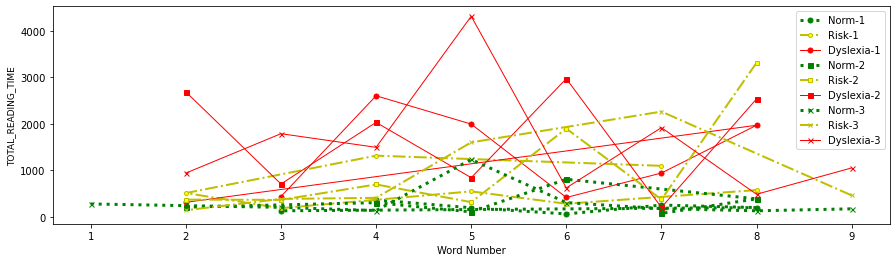

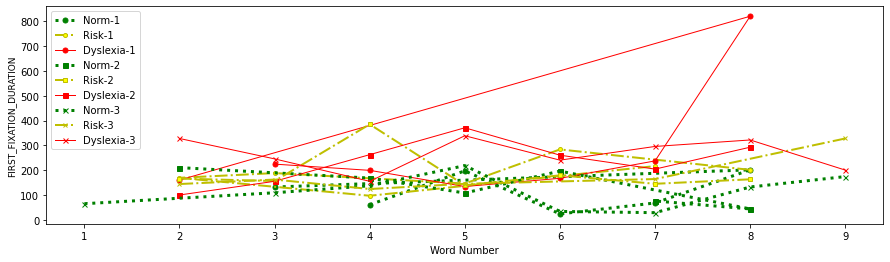

...

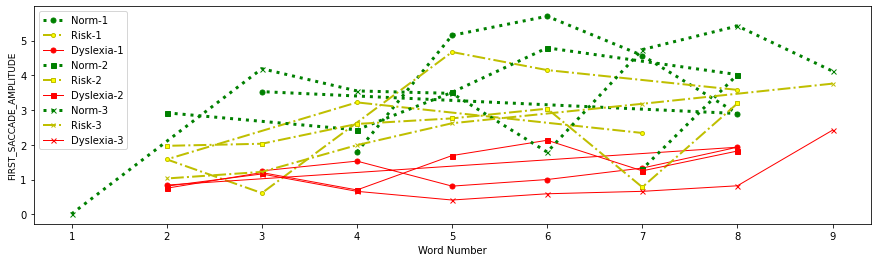

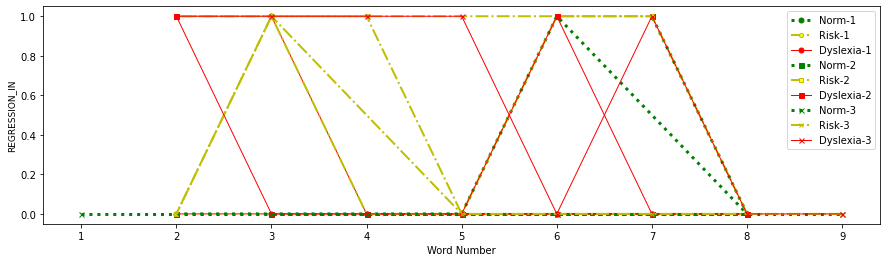

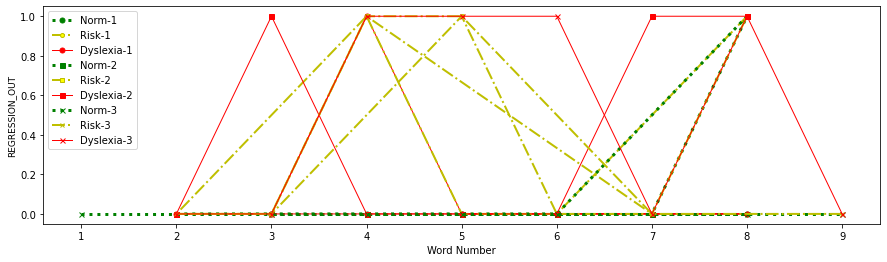

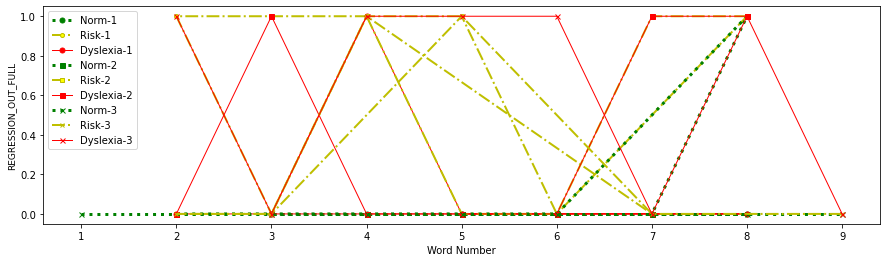

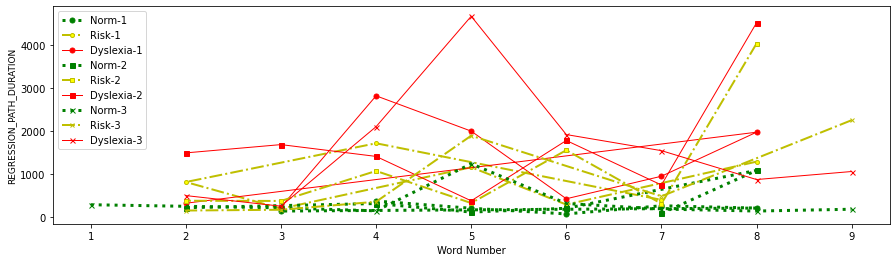

In [82]:


yn, yr, yd = plot_sevaral_sentences_per_user(data, sentences[:3],
                                             norm_users, risk_users, 
                                             dyslexic_users, 1)



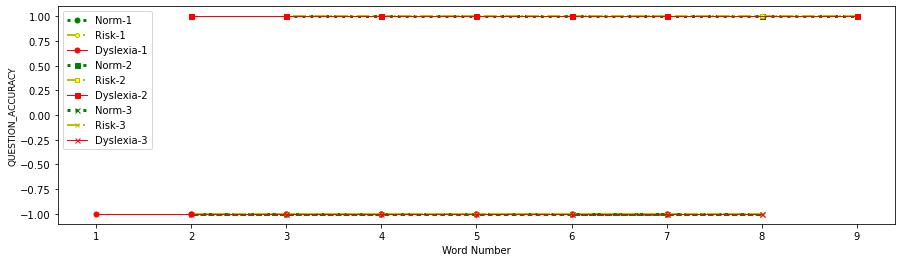

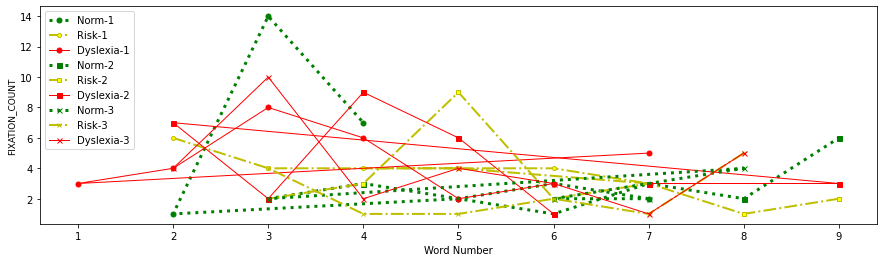

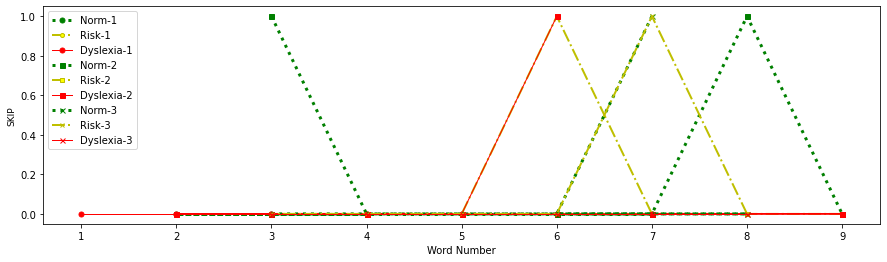

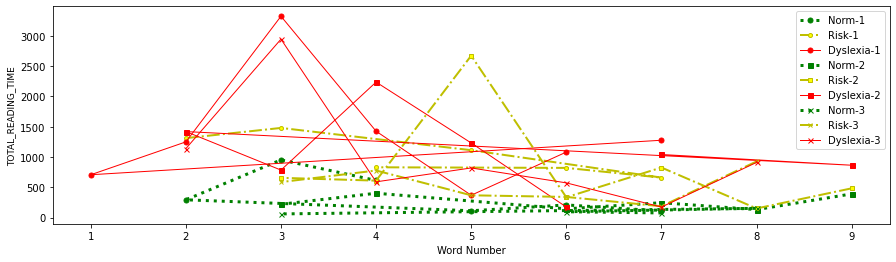

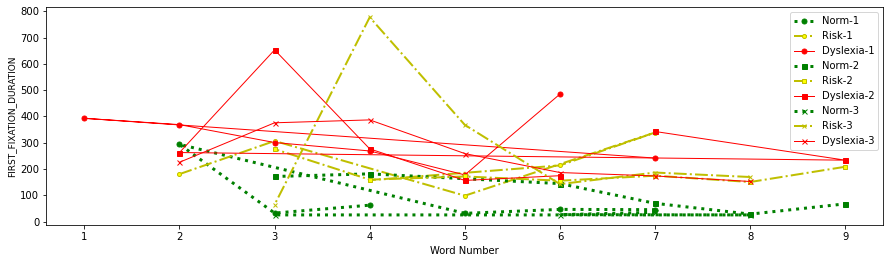

...

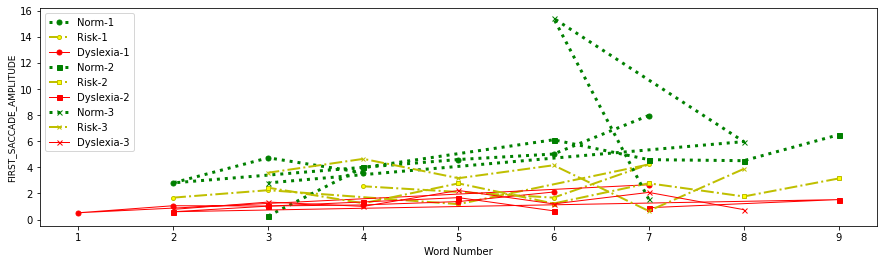

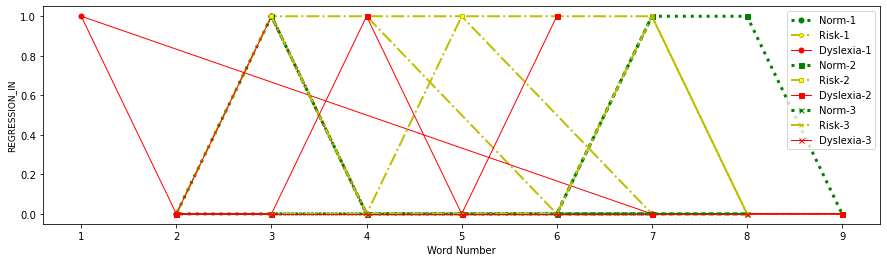

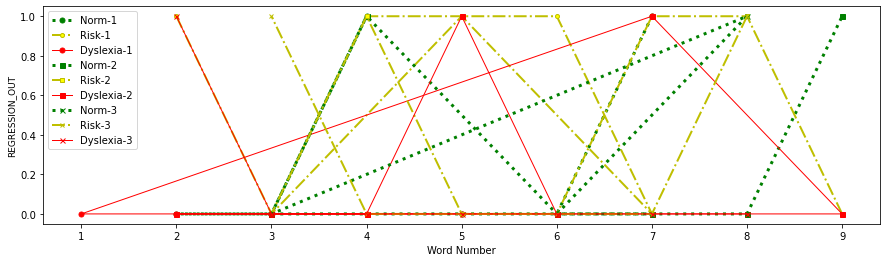

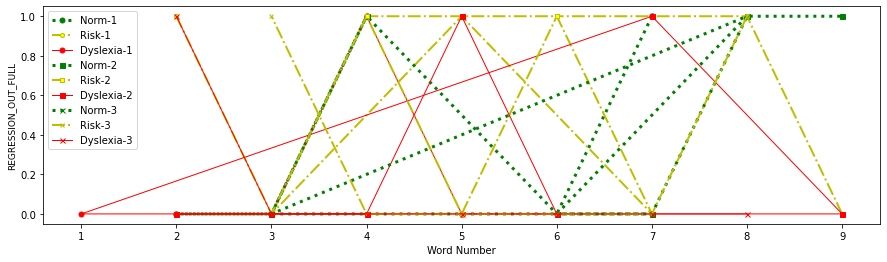

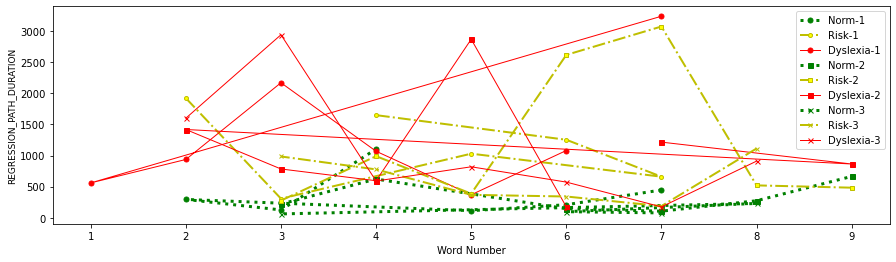

In [83]:

yn, yr, yd = plot_sevaral_sentences_per_user(data, sentences[15:18], 
                                             norm_users, risk_users, 
                                             dyslexic_users, 1)






#  Representatives: average and standard deviations


Since interpreting the above plots are difficult and time consuming, thus I decided to use means and std of the performance randomly selected users for the same set of sentences.






In [84]:


norm_means, norm_stds = [], []
risk_means, risk_stds = [], []
dyslexia_means, dyslexia_stds = [], []

for sentence in sentences:
    yn = data.loc[
        (data["Sentence_ID"] == sentence) &
        (data["SubjectID"].isin(norm_users))
    ]

    norm_means.append(yn.iloc[:, 4:].mean(axis=0))
    norm_stds.append(yn.iloc[:, 4:].std(axis=0))
    
    yr = data.loc[
        (data["Sentence_ID"] == sentence) &
        (data["SubjectID"].isin(risk_users))
    ]
    
    risk_means.append(yr.iloc[:, 4:].mean(axis=0))
    risk_stds.append(yr.iloc[:, 4:].std(axis=0))
    
    
    yd = data.loc[
        (data["Sentence_ID"] == sentence) &
        (data["SubjectID"].isin(dyslexic_users))
    ]
    dyslexia_means.append(yd.iloc[:, 4:].mean(axis=0))
    dyslexia_stds.append(yd.iloc[:, 4:].std(axis=0))
    
    

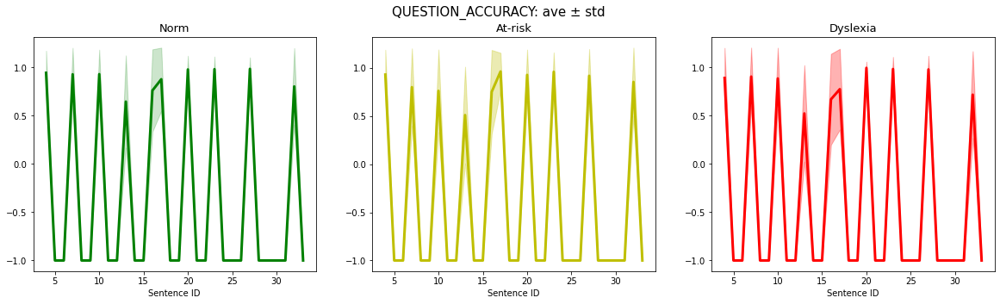

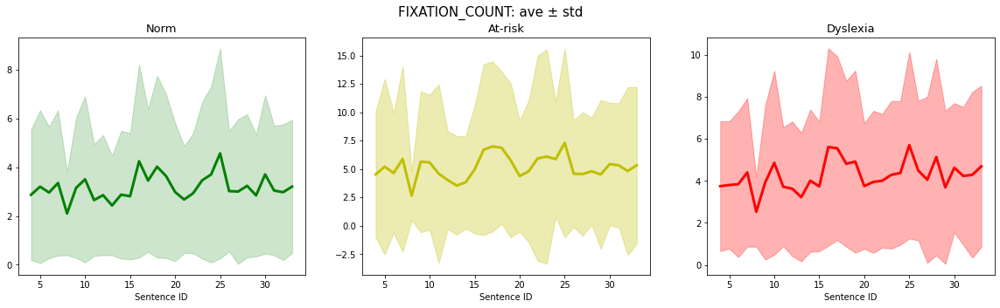

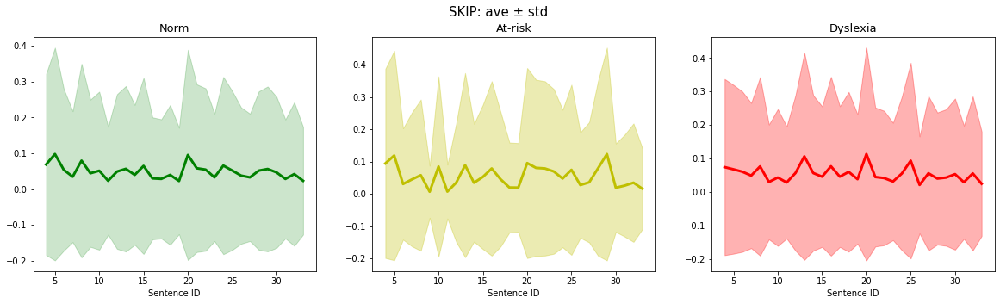

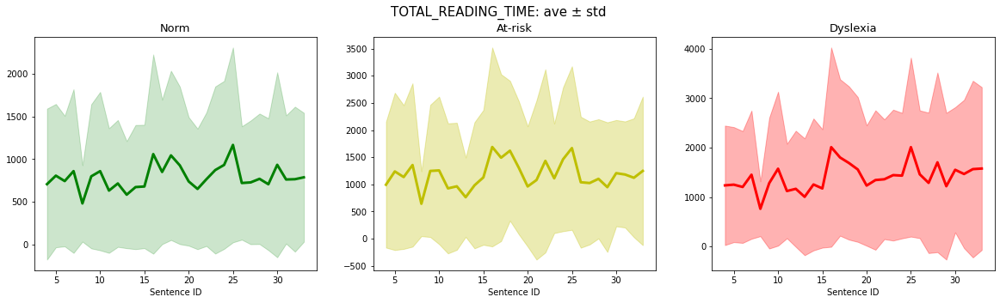

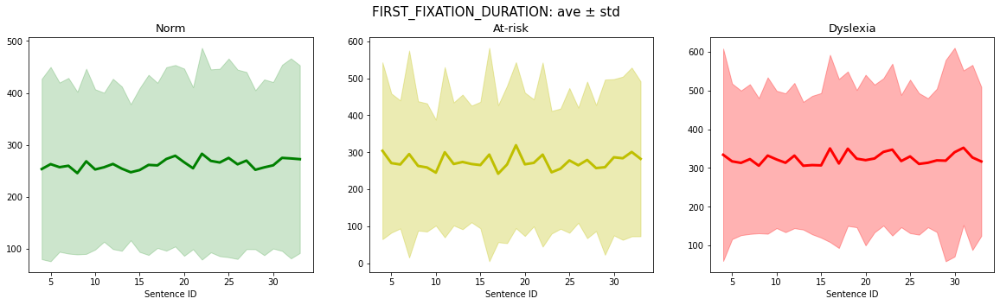

...

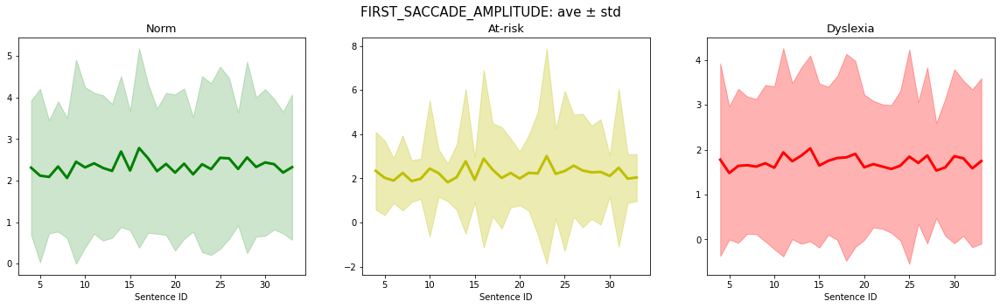

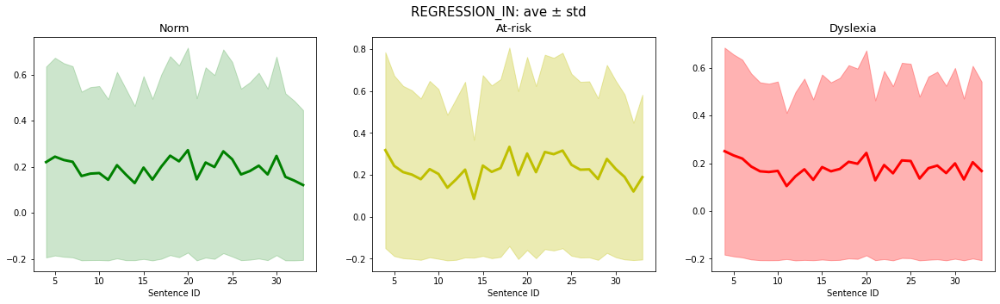

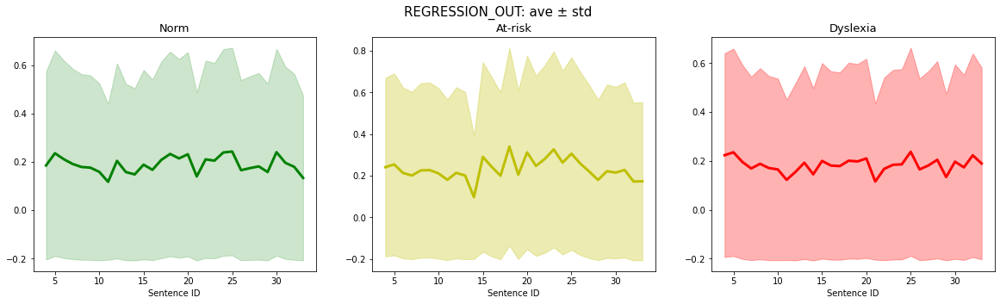

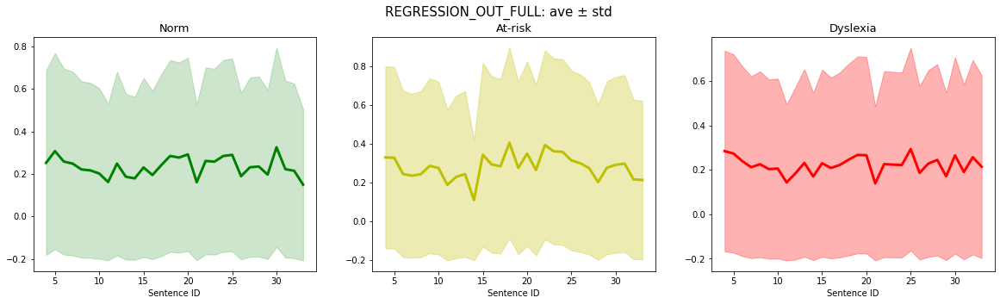

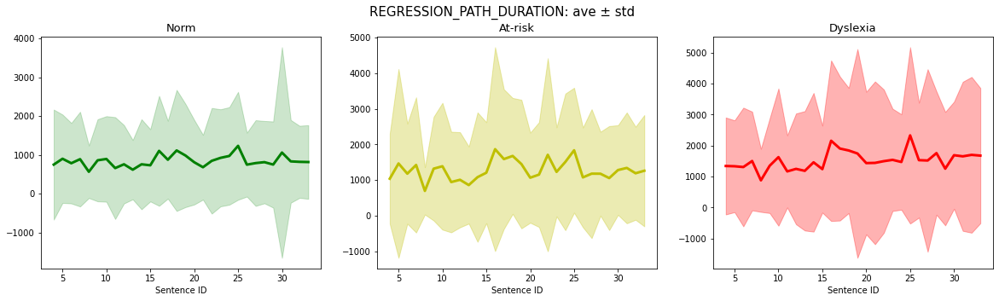

In [85]:


for f in norm_means[0].index:
    
    fig = plt.figure(figsize=(20, 5))
    ax = fig.add_subplot(1, 3, 1)
    x = range(4, 34)
    nm = pd.concat(norm_means, axis=1).T
    ns = pd.concat(norm_stds, axis=1).T
    ax.plot(x, 
            nm[f].values, 
            color="g", 
            linewidth=3
           )
    ax.fill_between(x, 
                    nm[f].values+ns[f].values, 
                    nm[f].values-ns[f].values,
                    alpha=0.2,
                    color="g",
                   )
    ax.set_title("Norm", fontsize=13, )
    plt.xlabel("Sentence ID")
    
    ax = fig.add_subplot(1, 3, 2)
    rm = pd.concat(risk_means, axis=1).T
    rs = pd.concat(risk_stds, axis=1).T
    ax.plot(x, rm[f].values, 
            color="y", linewidth=3
           )
    ax.fill_between(x, 
                    rm[f].values+rs[f].values, 
                    rm[f].values-rs[f].values,
                    alpha=0.3,
                    color="y",
                    )
    ax.set_title("At-risk", fontsize=13, )
    plt.xlabel("Sentence ID")
    
    ax = fig.add_subplot(1, 3, 3)
    dm = pd.concat(dyslexia_means, axis=1).T
    ds = pd.concat(dyslexia_stds, axis=1).T
    ax.plot(x, dm[f].values, color="r", linewidth=3)
    ax.fill_between(x, 
                    dm[f].values+ds[f].values, 
                    dm[f].values-ds[f].values,
                    alpha=0.3,
                    color="r",
                    )
    ax.set_title("Dyslexia", fontsize=13)
    plt.xlabel("Sentence ID")
    
    fig.suptitle(f + ": ave ± std", fontsize=15)

   
    plt.show()



### Conclusion:

- Question accuracy cannot be considered as a discriminating feature, as the participants from different groups may have similar results;


- "Fixation count", "total reading time," "first fixation duration," and "first run total reading time" in dyslexic and at-risk participants are significantly higher (however, the plots are very similar);


- Fixation along X coordinate does not differ in the three groups under investigation. However, the normal participants have shown relatively similar and horizontal line behavior, unlike the two remaining groups;


- To my surprise, the first saccade amplitude observed patterns in normal and dyslexic groups are similar, though, in the at-risk group, it depicts different behavior with a significantly lower standard deviation;


- Regression path duration has lower average and std values than the two other groups.



